# **Cell 1 – Structure Scanner + Paths Skeleton**

In [1]:
import os
import json
from pathlib import Path
from datetime import datetime
import pandas as pd
from IPython.display import display

# ============================================================
# CONFIG
# ============================================================
ROOT = Path("/kaggle/input")
GROUP_NAME = "mixed-mendeley"

IMAGE_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff', '.gif', '.webp'}
META_EXTS  = {'.csv', '.tsv', '.xlsx', '.xls', '.json', '.txt', '.xml'}

structure = {}
meta_files = []

def is_image(p: Path) -> bool:
    return p.suffix.lower() in IMAGE_EXTS

def walk(path: Path, current_dict: dict):
    print(f"Checking → {path}")
    
    try:
        entries = sorted(path.iterdir())
    except PermissionError:
        print(f"  ⚠️  Permission denied: {path}")
        return

    has_image = any(is_image(e) for e in entries if e.is_file())
    
    if has_image:
        current_dict["__contains_images__"] = True
        current_dict["__subdirs__"] = [e.name for e in entries if e.is_dir()]
        print(f"  → Contains images. Stopping deeper traversal.")
        return

    for entry in entries:
        if entry.is_dir():
            current_dict[entry.name] = {}
            walk(entry, current_dict[entry.name])
        elif entry.suffix.lower() in META_EXTS:
            meta_files.append(str(entry))
            current_dict.setdefault("__meta_files__", []).append(entry.name)
            print(f"  → Found metadata: {entry.name}")

# ============================================================
# RUN SCAN
# ============================================================
print(f"Scanning structure for group: {GROUP_NAME}\n")
walk(ROOT, structure)

# Save structure
structure_path = f"/kaggle/working/{GROUP_NAME}_structure.json"
with open(structure_path, "w") as f:
    json.dump(structure, f, indent=2)
print(f"\n✅ Structure JSON saved → {structure_path}")

# ============================================================
# PATHS DB SKELETON
# ============================================================
paths_db = {
    "group": GROUP_NAME,
    "created": datetime.now().isoformat(),
    "datasets": {}          # will be filled after we see the scan
}

paths_path = f"/kaggle/working/{GROUP_NAME}_paths_db.json"
with open(paths_path, "w") as f:
    json.dump(paths_db, f, indent=2)
print(f"✅ Paths DB skeleton saved → {paths_path}")

# ============================================================
# SHOW METADATA
# ============================================================
print("\n===== METADATA / CSV FILES FOUND =====")
if meta_files:
    df_meta = pd.DataFrame({
        "Metadata File": meta_files,
        "Parent Folder": [str(Path(p).parent) for p in meta_files]
    })
    display(df_meta)
else:
    print("No CSV / metadata files found.")

print("\nDone. Paste the scan output (especially the main dataset folders under /kaggle/input/datasets/).")

Scanning structure for group: mixed-mendeley

Checking → /kaggle/input
Checking → /kaggle/input/datasets
Checking → /kaggle/input/datasets/abhinav099802
Checking → /kaggle/input/datasets/abhinav099802/eye-disease-image-dataset
Checking → /kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data
Checking → /kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset
Checking → /kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset/Central Serous Chorioretinopathy
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset/Diabetic Retinopathy
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset/Disc Edema
  → Contains images. Stopping deeper traversal.
Checking → /kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset/

# **Final Paths DB**

In [2]:
import json
from datetime import datetime

paths_db = {
    "group": "mixed-mendeley",
    "created": datetime.now().isoformat(),
    "datasets": {
        "abhinav099802 - Original": {
            "kaggle_slug": "abhinav099802/eye-disease-image-dataset",
            "root": "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Original_Dataset",
            "images_folder": "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Original_Dataset",
            "type": "folder_based",
            "classes": [
                "Central Serous Chorioretinopathy", "Diabetic Retinopathy", "Disc Edema",
                "Glaucoma", "Healthy", "Macular Scar", "Myopia", "Pterygium",
                "Retinal Detachment", "Retinitis Pigmentosa"
            ],
            "notes": "Original (non-augmented) version"
        },
        "abhinav099802 - Augmented": {
            "kaggle_slug": "abhinav099802/eye-disease-image-dataset",
            "root": "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset",
            "images_folder": "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset",
            "type": "folder_based",
            "classes": [
                "Central Serous Chorioretinopathy", "Diabetic Retinopathy", "Disc Edema",
                "Glaucoma", "Healthy", "Macular Scar", "Myopia", "Pterygium",
                "Retinal Detachment", "Retinitis Pigmentosa"
            ],
            "notes": "Augmented version"
        },
        "linabennaa - Original": {
            "kaggle_slug": "linabennaa/original-eye-disease-image-dataset-mendeley",
            "root": "/kaggle/input/datasets/linabennaa/original-eye-disease-image-dataset-mendeley/Original Dataset",
            "images_folder": "/kaggle/input/datasets/linabennaa/original-eye-disease-image-dataset-mendeley/Original Dataset",
            "type": "folder_based",
            "classes": [
                "CSCR_Color Fundus", "Diabetic Retinopathy", "Disc Edema",
                "Glaucoma", "Healthy", "Macular Scar", "Myopia", "Pterygium",
                "Retinal Detachment", "Retinitis Pigmentosa"
            ],
            "notes": "Original Mendeley version"
        },
        "linabennaa - Augmented": {
            "kaggle_slug": "linabennaa/eye-disease-image-dataset-mendeley",
            "root": "/kaggle/input/datasets/linabennaa/eye-disease-image-dataset-mendeley/Augmented Dataset",
            "images_folder": "/kaggle/input/datasets/linabennaa/eye-disease-image-dataset-mendeley/Augmented Dataset",
            "type": "folder_based",
            "classes": [
                "Central Serous Chorioretinopathy_Color Fundus", "Diabetic Retinopathy", "Disc Edema",
                "Glaucoma", "Healthy", "Macular Scar", "Myopia", "Pterygium",
                "Retinal Detachment", "Retinitis Pigmentosa"
            ],
            "notes": "Augmented version"
        },
        "linabennaa - Balanced": {
            "kaggle_slug": "linabennaa/balanced-eye-disease-image-dataset-mendeley",
            "root": "/kaggle/input/datasets/linabennaa/balanced-eye-disease-image-dataset-mendeley/Augmented Dataset Balanced",
            "images_folder": "/kaggle/input/datasets/linabennaa/balanced-eye-disease-image-dataset-mendeley/Augmented Dataset Balanced",
            "type": "folder_based",
            "classes": [
                "CSCR Color Fundus", "Diabetic Retinopathy", "Disc Edema",
                "Glaucoma", "Healthy", "Macular Scar", "Myopia", "Pterygium",
                "Retinal Detachment", "Retinitis Pigmentosa"
            ],
            "notes": "Balanced augmented version"
        },
        "shufanshahi - Original": {
            "kaggle_slug": "shufanshahi/eye-disease-image-dataset",
            "root": "/kaggle/input/datasets/shufanshahi/eye-disease-image-dataset/Eye Disease Image Dataset/Original Dataset",
            "images_folder": "/kaggle/input/datasets/shufanshahi/eye-disease-image-dataset/Eye Disease Image Dataset/Original Dataset",
            "type": "folder_based",
            "classes": [
                "Central Serous Chorioretinopathy", "Diabetic Retinopathy", "Disc Edema",
                "Glaucoma", "Healthy", "Macular Scar", "Myopia", "Pterygium",
                "Retinal Detachment", "Retinitis Pigmentosa"
            ],
            "notes": "Original version"
        }
    }
}

with open("/kaggle/working/mixed-mendeley_paths_db.json", "w") as f:
    json.dump(paths_db, f, indent=2)

print("✅ paths_db saved")
print(json.dumps(paths_db, indent=2))

✅ paths_db saved
{
  "group": "mixed-mendeley",
  "created": "2026-09-24T08:09:02.698517",
  "datasets": {
    "abhinav099802 - Original": {
      "kaggle_slug": "abhinav099802/eye-disease-image-dataset",
      "root": "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Original_Dataset",
      "images_folder": "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Original_Dataset",
      "type": "folder_based",
      "classes": [
        "Central Serous Chorioretinopathy",
        "Diabetic Retinopathy",
        "Disc Edema",
        "Glaucoma",
        "Healthy",
        "Macular Scar",
        "Myopia",
        "Pterygium",
        "Retinal Detachment",
        "Retinitis Pigmentosa"
      ],
      "notes": "Original (non-augmented) version"
    },
    "abhinav099802 - Augmented": {
      "kaggle_slug": "abhinav099802/eye-disease-image-dataset",
      "root": "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset",
    

In [3]:
import os
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")

def analyze_dataset(dataset_name: str, root_path: str, class_folders: list = None, 
                    csv_path: str = None, label_col: str = None, image_col: str = None,
                    max_samples_per_class: int = 3):
    """
    Universal analyzer for fundus datasets.
    """
    
    print("="*80)
    print(f"DATASET: {dataset_name}")
    print("="*80)
    
    root = Path(root_path)
    image_exts = {'.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff'}
    
    data = []
    
    if csv_path is not None:
        df = pd.read_csv(csv_path)
        print(f"CSV loaded: {csv_path}  |  shape = {df.shape}")
        print("Columns:", df.columns.tolist())
        
        if label_col is None or image_col is None:
            print("⚠️  Please provide label_col and image_col")
            return
        
        for _, row in df.iterrows():
            img_name = str(row[image_col])
            label = str(row[label_col])
            possible = list(root.rglob(img_name))
            if not possible:
                possible = list(root.rglob(f"*{Path(img_name).stem}*"))
            if possible:
                data.append((label, possible[0]))
    else:
        if class_folders is None:
            class_folders = []
            for p in root.iterdir():
                if p.is_dir():
                    has_img = any(f.suffix.lower() in image_exts for f in p.rglob("*") if f.is_file())
                    if has_img:
                        class_folders.append(p.name)
        
        print(f"Class folders found: {class_folders}")
        
        for cls in class_folders:
            cls_path = root / cls
            if not cls_path.exists():
                matches = list(root.rglob(cls))
                if matches:
                    cls_path = matches[0]
                else:
                    continue
            
            for img_path in cls_path.rglob("*"):
                if img_path.suffix.lower() in image_exts:
                    data.append((cls, img_path))
    
    if len(data) == 0:
        print("❌ No images found. Check the path.")
        return
    
    # Summary table
    class_counts = Counter([d[0] for d in data])
    total_images = sum(class_counts.values())
    
    res_per_class = defaultdict(set)
    size_per_class = defaultdict(list)
    
    print("\nCollecting resolution & size info...")
    for cls, path in data:
        try:
            img = cv2.imread(str(path))
            if img is None:
                continue
            h, w = img.shape[:2]
            res_per_class[cls].add(f"{w}x{h}")
            size_mb = path.stat().st_size / (1024 * 1024)
            size_per_class[cls].append(size_mb)
        except:
            pass
    
    rows = []
    for cls in sorted(class_counts.keys()):
        count = class_counts[cls]
        pct = count / total_images * 100
        resolutions = ", ".join(sorted(res_per_class[cls])) if res_per_class[cls] else "N/A"
        avg_size = np.mean(size_per_class[cls]) if size_per_class[cls] else 0
        rows.append({
            "Class": cls,
            "Image Count": count,
            "Percentage": f"{pct:.1f}%",
            "Resolution(s)": resolutions,
            "Avg Size (MB)": f"{avg_size:.3f}"
        })
    
    all_sizes = [s for sizes in size_per_class.values() for s in sizes]
    rows.append({
        "Class": "TOTAL",
        "Image Count": total_images,
        "Percentage": "100%",
        "Resolution(s)": "-",
        "Avg Size (MB)": f"{np.mean(all_sizes):.3f}" if all_sizes else "0"
    })
    
    df_summary = pd.DataFrame(rows)
    print("\n----- SUMMARY TABLE -----")
    display(df_summary)
    
    # Sample images
    print("\n----- SAMPLE IMAGES PER CLASS -----")
    classes = sorted(class_counts.keys())
    samples = defaultdict(list)
    for cls, path in data:
        if len(samples[cls]) < max_samples_per_class:
            samples[cls].append(path)
    
    cols = min(max_samples_per_class, 3)
    rows_plot = len(classes)
    
    fig, axes = plt.subplots(rows_plot, cols, figsize=(4*cols, 3.5*rows_plot))
    if rows_plot == 1:
        axes = np.array([axes])
    if cols == 1:
        axes = axes.reshape(-1, 1)
    
    for i, cls in enumerate(classes):
        for j in range(cols):
            ax = axes[i, j]
            if j < len(samples[cls]):
                img = cv2.imread(str(samples[cls][j]))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                ax.imshow(img)
                ax.set_title(f"{cls}", fontsize=10)
            ax.axis("off")
    
    plt.suptitle(f"{dataset_name} – Sample Images", fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()
    
    # Stats
    print("\n----- IMAGE STATISTICAL ANALYSIS -----")
    all_widths, all_heights, all_sizes_mb = [], [], []
    channels = []
    
    for cls, path in data[:min(500, len(data))]:
        try:
            img = cv2.imread(str(path))
            if img is None:
                continue
            h, w = img.shape[:2]
            all_widths.append(w)
            all_heights.append(h)
            all_sizes_mb.append(path.stat().st_size / (1024*1024))
            channels.append(img.shape[2] if len(img.shape) == 3 else 1)
        except:
            pass
    
    stats = {
        "Total Images Analyzed": len(all_widths),
        "Unique Resolutions": len(set(zip(all_widths, all_heights))),
        "Width  – min / mean / max": f"{min(all_widths)} / {np.mean(all_widths):.0f} / {max(all_widths)}",
        "Height – min / mean / max": f"{min(all_heights)} / {np.mean(all_heights):.0f} / {max(all_heights)}",
        "File Size (MB) – min / mean / max": f"{min(all_sizes_mb):.3f} / {np.mean(all_sizes_mb):.3f} / {max(all_sizes_mb):.3f}",
        "Channels (most common)": Counter(channels).most_common(1)[0][0] if channels else "N/A"
    }
    
    for k, v in stats.items():
        print(f"{k:35s} : {v}")
    
    print("\n" + "="*80 + "\n")

# **Analysis Cells**

DATASET: abhinav099802 - Original
Class folders found: ['Macular Scar', 'Pterygium', 'Disc Edema', 'Central Serous Chorioretinopathy', 'Glaucoma', 'Healthy', 'Retinal Detachment', 'Retinitis Pigmentosa', 'Myopia', 'Diabetic Retinopathy']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,Central Serous Chorioretinopathy,101,1.9%,2004x1690,0.333
1,Diabetic Retinopathy,1509,28.3%,2004x1690,0.294
2,Disc Edema,127,2.4%,2004x1690,0.357
3,Glaucoma,1349,25.3%,2004x1690,0.326
4,Healthy,1024,19.2%,2004x1690,0.316
5,Macular Scar,444,8.3%,2004x1690,0.318
6,Myopia,500,9.4%,2004x1690,0.325
7,Pterygium,17,0.3%,2004x1690,0.457
8,Retinal Detachment,125,2.3%,2004x1690,0.349
9,Retinitis Pigmentosa,139,2.6%,2004x1690,0.328



----- SAMPLE IMAGES PER CLASS -----


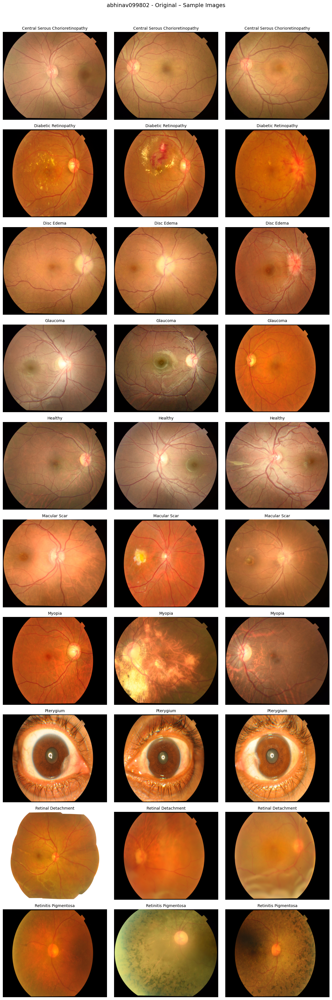


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 1
Width  – min / mean / max           : 2004 / 2004 / 2004
Height – min / mean / max           : 1690 / 1690 / 1690
File Size (MB) – min / mean / max   : 0.137 / 0.325 / 0.489
Channels (most common)              : 3




In [4]:
# 1. abhinav099802 - Original
analyze_dataset(
    dataset_name = "abhinav099802 - Original",
    root_path    = "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Original_Dataset",
    class_folders = None
)

DATASET: abhinav099802 - Augmented
Class folders found: ['Macular Scar', 'Pterygium', 'Disc Edema', 'Central Serous Chorioretinopathy', 'Glaucoma', 'Healthy', 'Retinal Detachment', 'Retinitis Pigmentosa', 'Myopia', 'Diabetic Retinopathy']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,Central Serous Chorioretinopathy,606,3.7%,2004x1690,0.163
1,Diabetic Retinopathy,3444,21.2%,2004x1690,0.129
2,Disc Edema,762,4.7%,2004x1690,0.151
3,Glaucoma,2880,17.7%,2004x1690,0.156
4,Healthy,2676,16.5%,2004x1690,0.164
5,Macular Scar,1937,11.9%,2004x1690,0.151
6,Myopia,2251,13.9%,2004x1690,0.142
7,Pterygium,102,0.6%,2004x1690,0.177
8,Retinal Detachment,750,4.6%,2004x1690,0.121
9,Retinitis Pigmentosa,834,5.1%,2004x1690,0.143



----- SAMPLE IMAGES PER CLASS -----


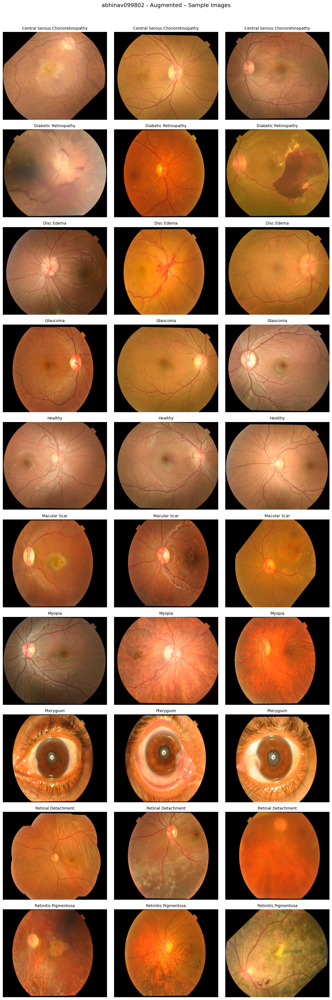


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 1
Width  – min / mean / max           : 2004 / 2004 / 2004
Height – min / mean / max           : 1690 / 1690 / 1690
File Size (MB) – min / mean / max   : 0.082 / 0.150 / 0.215
Channels (most common)              : 3




In [5]:
# 2. abhinav099802 - Augmented
analyze_dataset(
    dataset_name = "abhinav099802 - Augmented",
    root_path    = "/kaggle/input/datasets/abhinav099802/eye-disease-image-dataset/data/Augmented_Dataset",
    class_folders = None
)

DATASET: linabennaa - Original
Class folders found: ['Macular Scar', 'CSCR_Color Fundus', 'Pterygium', 'Disc Edema', 'Glaucoma', 'Healthy', 'Retinal Detachment', 'Retinitis Pigmentosa', 'Myopia', 'Diabetic Retinopathy']


----- SUMMARY TABLE -----


,Class,Image Count,Percentage,Resolution(s),Avg Size (MB)
0,CSCR_Color Fundus,101,1.9%,2004x1690,0.333
1,Diabetic Retinopathy,1509,28.3%,2004x1690,0.294
2,Disc Edema,127,2.4%,2004x1690,0.357
3,Glaucoma,1349,25.3%,2004x1690,0.326
4,Healthy,1024,19.2%,2004x1690,0.316
5,Macular Scar,444,8.3%,2004x1690,0.318
6,Myopia,500,9.4%,2004x1690,0.325
7,Pterygium,17,0.3%,2004x1690,0.457
8,Retinal Detachment,125,2.3%,2004x1690,0.349
9,Retinitis Pigmentosa,139,2.6%,2004x1690,0.328



----- SAMPLE IMAGES PER CLASS -----


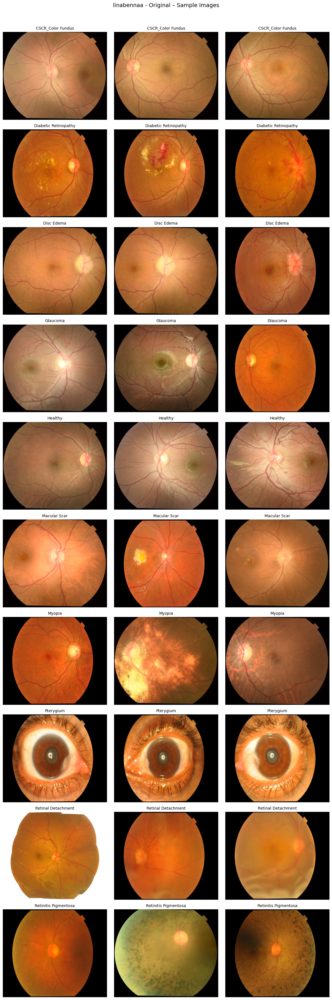


----- IMAGE STATISTICAL ANALYSIS -----
Total Images Analyzed               : 500
Unique Resolutions                  : 1
Width  – min / mean / max           : 2004 / 2004 / 2004
Height – min / mean / max           : 1690 / 1690 / 1690
File Size (MB) – min / mean / max   : 0.137 / 0.319 / 0.489
Channels (most common)              : 3




In [6]:
# 3. linabennaa - Original
analyze_dataset(
    dataset_name = "linabennaa - Original",
    root_path    = "/kaggle/input/datasets/linabennaa/original-eye-disease-image-dataset-mendeley/Original Dataset",
    class_folders = None
)